## Check CUDA + Installization

In [1]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


In [2]:
!pip install -q torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu122

In [3]:
!pip install -q -U bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 57.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.8 MB/s eta 0:00:00


In [4]:
!pip install -q sentence-transformers

In [5]:
import torch
print(torch.cuda.is_available())  # Should print True
print(torch.cuda.device_count())  # Should print 1 or more
print(torch.cuda.get_device_name(0))  # Should show your GPU model

True
2
Tesla T4


# Read data

In [6]:
import os
import shutil
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio 
import re
from tqdm import tqdm
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from bertopic import BERTopic
from transformers import pipeline, AutoTokenizer

In [7]:
pd.set_option("display.max_columns", None)  # Show all columns
pd.set_option("display.width", 1000)  # Prevent line breaks
pd.set_option("display.max_colwidth", None)  # Show full text in each column

In [8]:
data = pd.read_csv('/kaggle/input/elon-musks-tweet/all_musk_posts_2010-06-04_2025-03-23.csv')

<ipython-input-8-20f7f98576f9>:1: DtypeWarning: Columns (11,16,17,18,19,23) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('/kaggle/input/elon-musks-tweet/all_musk_posts_2010-06-04_2025-03-23.csv')


In [9]:
data.head(5)

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,url,twitterUrl,fullText,retweetCount,replyCount,likeCount,quoteCount,viewCount,createdAt,bookmarkCount,isReply,inReplyToId,conversationId,inReplyToUserId,inReplyToUsername,isPinned,isRetweet,isQuote,isConversationControlled,possiblySensitive,quoteId,quote,retweet
0,1655159652990976000,https://x.com/elonmusk/status/1655159652990976000,https://twitter.com/elonmusk/status/1655159652990976000,RT @einarvollset: I read @paulg’s “How to Make Wealth” in Hackers &amp; Painters when I was in my mid twenties. It’s one of those pieces that…,NaN,NaN,NaN,NaN,NaN,2023-05-07 10:36:27+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1657261624867299339,https://x.com/elonmusk/status/1657261624867299339,https://twitter.com/elonmusk/status/1657261624867299339,https://t.co/Zjn6r15lrR,NaN,NaN,NaN,NaN,NaN,2023-05-13 05:48:56+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1623774484795920384,https://x.com/elonmusk/status/1623774484795920384,https://twitter.com/elonmusk/status/1623774484795920384,"RT @BillyM2k: dude bookmarks are an awesome twitter feature, especially when preparing for a twitter spaces where you want to talk about pa…",NaN,NaN,NaN,NaN,NaN,2023-02-09 20:03:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1656900119202254854,https://x.com/elonmusk/status/1656900119202254854,https://twitter.com/elonmusk/status/1656900119202254854,Event Horizon Balance Beam,NaN,NaN,NaN,NaN,NaN,2023-05-12 05:52:26+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1616531874763116544,https://x.com/elonmusk/status/1616531874763116544,https://twitter.com/elonmusk/status/1616531874763116544,RT @BillyM2k: @elonmusk oh that’s actually pretty cool! https://t.co/5m3XiMnazJ,NaN,NaN,NaN,NaN,NaN,2023-01-20 20:23:27+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


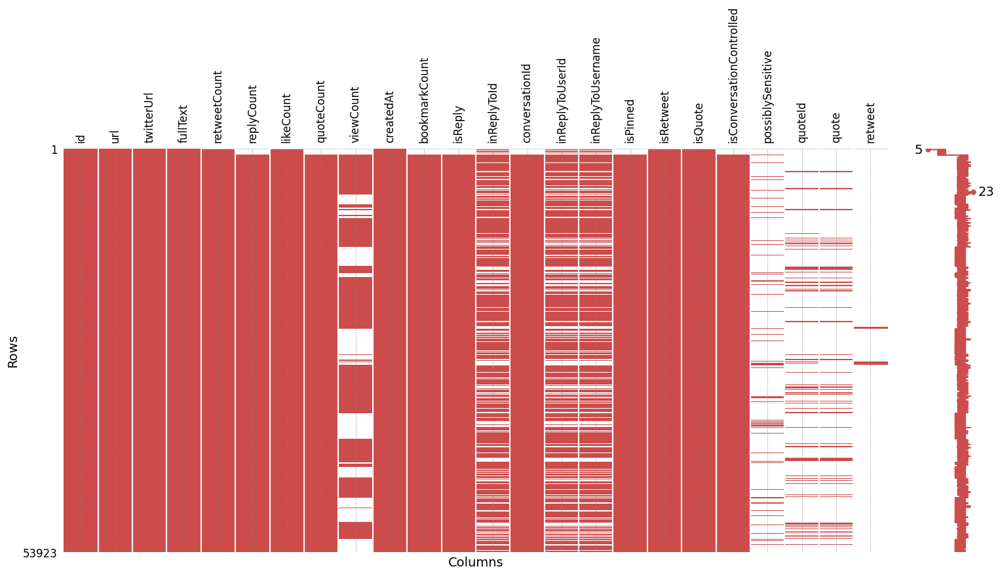

In [10]:
import missingno as msno
import matplotlib.pyplot as plt

# Create the matrix with custom colors
# 'color' is for present values (RGB), 'null_color' for missing values
ax = msno.matrix(data, 
                 color=(0.8, 0.3, 0.3),  # A nice blue shade for present values
                 sparkline=True,         # Show sparklines at the right
                 figsize=(18, 8))        # Already set above, but can override here

# Customize the plot
plt.xlabel("Columns", fontsize=14)
plt.ylabel("Rows", fontsize=14)

# Adjust tick parameters
plt.xticks(fontsize=12, rotation=90, ha='center')  # Rotate column names for readability
plt.yticks(fontsize=12)

# Add a grid for better structure (optional)
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

# Customize the colorbar (if you want to tweak it further)
# Note: msno.matrix doesn't directly support a colorbar, but you can adjust visuals via Matplotlib
plt.tight_layout()

# Show the plot
plt.show()

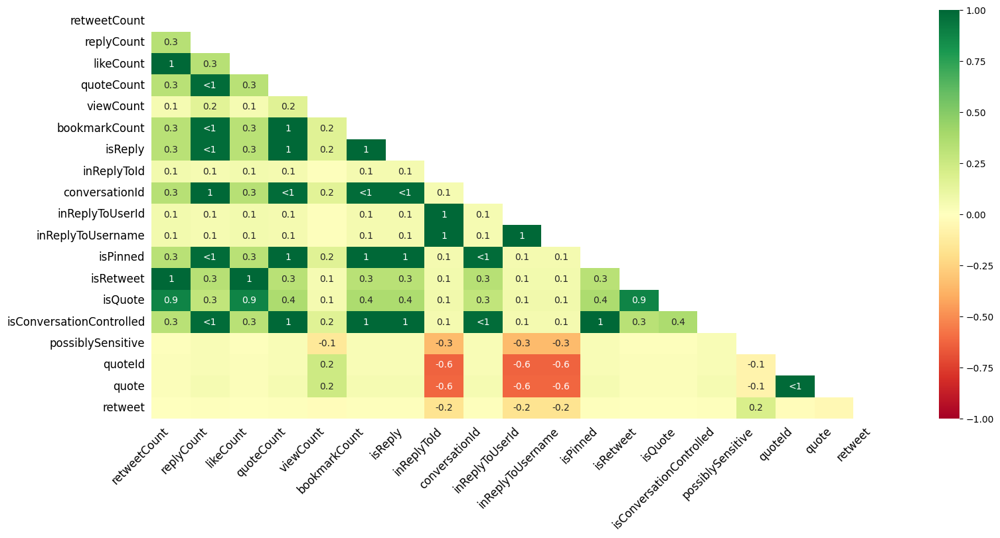

In [11]:
msno.heatmap(data, cmap="RdYlGn", figsize=(18,8), fontsize=12);

In [12]:
missing_values = data.isnull().sum()
print("Missing values for each column:")
print(missing_values)

Missing values for each column:
id                              0
url                             0
twitterUrl                      0
fullText                        0
retweetCount                   90
replyCount                    802
likeCount                      90
quoteCount                    828
viewCount                   20644
createdAt                       0
bookmarkCount                 828
isReply                       828
inReplyToId                 14732
conversationId                802
inReplyToUserId             14709
inReplyToUsername           14709
isPinned                      828
isRetweet                      90
isQuote                       116
isConversationControlled      828
possiblySensitive           49211
quoteId                     46777
quote                       46950
retweet                     53285
dtype: int64


In [13]:
len(data)

53923

In [14]:
print(data['fullText'].iloc[:20])

0                                                                                                                                                                                    RT @einarvollset: I read @paulg’s  “How to Make Wealth” in Hackers &amp; Painters when I was in my mid twenties. It’s one of those pieces that…
1                                                                                                                                                                                                                                                                                                            https://t.co/Zjn6r15lrR
2                                                                                                                                                                                       RT @BillyM2k: dude bookmarks are an awesome twitter feature, especially when preparing for a twitter spaces where you want to talk about pa…
3                        

# *Data Cleaning*

In [15]:
# def clean_text(text):
#     """Basic text cleaning function"""
#     import re
#     text = re.sub(r'http\S+', '', text)  # Remove URLs
#     text = re.sub(r'@\w+', '', text) # Remove mentions
#     text = re.sub(r'(?i)\brt\b\s*', '', text) # Remove RT
#     text = re.sub(r'[^a-zA-Z0-9\s]', '', text)  # Remove special characters
#     text = text.lower().strip()
#     return text
# data['clean_text'] = data['fullText'].astype(str).apply(clean_text)

## Cleaning

In [16]:
import re

# Define preserved accounts in lowercase for consistent comparison
preserved_accounts = [
    'elonmusk', 'x', 'tesla', 'spacex', 'boringcompany', 'neuralink', 'xai',
    'starlink', 'teslamotorsjp', 'tesla_asia', 'officialteslakr', 'tesla_europe',
    'teslasolar', 'teslacharging', 'tesla_optimus', 'tesla_megapack', 'grok'
]

def clean_tweet(text):
    # Handle RTs: keep account if preserved, otherwise remove RT part
    def handle_rt(match):
        account = match.group(1)  # e.g., "einarvollset"
        if account.lower() in preserved_accounts:
            return f"{account} "  # Keep account name, add space
        return ""  # Remove RT entirely if not preserved

    # Process RTs at the start
    text = re.sub(r'(?i)^RT\s+@(\w+):\s*', handle_rt, text)

    # Handle mentions: keep if preserved, otherwise remove
    def replace_mentions(match):
        account = match.group(0).lstrip('@').rstrip("'s")  # e.g., "paulg" from "@paulg’s"
        if account.lower() in preserved_accounts:
            return account  # Keep account name
        return ""  # Remove mention if not preserved

    # Replace all mentions
    text = re.sub(r'@\w+(’s)?\b', replace_mentions, text)

    # Remove emojis using regex (covers most emojis)
    text = re.sub(r'[\U0001F600-\U0001F64F\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF\U0001F700-\U0001F77F\U0001F780-\U0001F7FF\U0001F800-\U0001F8FF\U0001F900-\U0001F9FF\U0001FA00-\U0001FA6F\U0001FA70-\U0001FAFF\U00002702-\U000027B0\U000024C2-\U0001F251]+', '', text)


    # Replace "&" with ";"
    text = re.sub(r'&amp', '', text)

    # Remove URLs
    text = re.sub(r'http\S+', '', text)

    # Clean up extra whitespace
    return text.strip()

In [17]:
#Cleaning using Regex
data['clean_text'] = data['fullText'].apply(clean_tweet)

## Remving Stopwords

In [18]:
# Download required NLTK data (run once)
nltk.download('punkt')
nltk.download('stopwords')

custom_stopwords = {
    'was', 'he', 'the', 'but', 'we', 'that', 'they', 'and', 'to', 
    'yeah', 'yep', 'yea', 'yah', 'bro', 'imo', 'right', 'now', 
    'like', 'exactly', 'yes', 'true', 'Cool', 'cool','haha','absolutely','interesting','seriously','nice', 'indeed', 'crazy', 'aargh', 'lord', 'first','!','! '
}

stop_words = set(stopwords.words('english')).union(custom_stopwords)

# # Get the English stop words
# stop_words = set(stopwords.words('english'))

# Function to remove stop words from text
def remove_stopwords(text):
    # Tokenize the text
    words = word_tokenize(text.lower())
    # Remove stop words and join words back
    cleaned_text = ' '.join(word for word in words if word not in stop_words)
    return cleaned_text

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [19]:
#Cleaning Stopwords
data['clean_text_stopwords'] = data['clean_text'].apply(remove_stopwords)

In [20]:
data

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,url,twitterUrl,fullText,retweetCount,replyCount,likeCount,quoteCount,viewCount,createdAt,bookmarkCount,isReply,inReplyToId,conversationId,inReplyToUserId,inReplyToUsername,isPinned,isRetweet,isQuote,isConversationControlled,possiblySensitive,quoteId,quote,retweet,clean_text,clean_text_stopwords
0,1655159652990976000,https://x.com/elonmusk/status/1655159652990976000,https://twitter.com/elonmusk/status/1655159652990976000,RT @einarvollset: I read @paulg’s “How to Make Wealth” in Hackers &amp; Painters when I was in my mid twenties. It’s one of those pieces that…,NaN,NaN,NaN,NaN,NaN,2023-05-07 10:36:27+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I read “How to Make Wealth” in Hackers ; Painters when I was in my mid twenties. It’s one of those pieces that…,read “ make wealth ” hackers ; painters mid twenties . ’ one pieces that…
1,1657261624867299339,https://x.com/elonmusk/status/1657261624867299339,https://twitter.com/elonmusk/status/1657261624867299339,https://t.co/Zjn6r15lrR,NaN,NaN,NaN,NaN,NaN,2023-05-13 05:48:56+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
2,1623774484795920384,https://x.com/elonmusk/status/1623774484795920384,https://twitter.com/elonmusk/status/1623774484795920384,"RT @BillyM2k: dude bookmarks are an awesome twitter feature, especially when preparing for a twitter spaces where you want to talk about pa…",NaN,NaN,NaN,NaN,NaN,2023-02-09 20:03:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"dude bookmarks are an awesome twitter feature, especially when preparing for a twitter spaces where you want to talk about pa…","dude bookmarks awesome twitter feature , especially preparing twitter spaces want talk pa…"
3,1656900119202254854,https://x.com/elonmusk/status/1656900119202254854,https://twitter.com/elonmusk/status/1656900119202254854,Event Horizon Balance Beam,NaN,NaN,NaN,NaN,NaN,2023-05-12 05:52:26+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Event Horizon Balance Beam,event horizon balance beam
4,1616531874763116544,https://x.com/elonmusk/status/1616531874763116544,https://twitter.com/elonmusk/status/1616531874763116544,RT @BillyM2k: @elonmusk oh that’s actually pretty cool! https://t.co/5m3XiMnazJ,NaN,NaN,NaN,NaN,NaN,2023-01-20 20:23:27+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,elonmusk oh that’s actually pretty cool!,elonmusk oh ’ actually pretty
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53918,736310020644569088,https://x.com/elonmusk/status/736310020644569088,https://twitter.com/elonmusk/status/736310020644569088,3 mins to launch https://t.co/i5jNDs9MCO,577.0,115.0,2007.0,0.0,NaN,2016-05-27 21:36:03+00:00,0.0,False,NaN,7.363100e+17,NaN,NaN,False,False,True,False,False,7.363054e+17,"{'type': 'tweet', 'id': '736305431417491457', 'text': 'About 20 minutes from launch window opening. \nWebcast now live → https://t.co/tdni53IviI https://t.co/7xnzmOpJOx', 'source': 'Twitter Web Client', 'retweetCount': 542, 'replyCount': 54, 'likeCount': 838, 'quoteCount': 0, 'createdAt': 'Fri May 27 21:17:49 +0000 2016', 'lang': 'en', 'bookmarkCount': 0, 'possiblySensitive': False, 'isPinned': False, 'author': {'type': 'user', 'userName': 'SpaceX', 'url': 'https://x.com/SpaceX', 'twitterUrl': 'https://twitter.com/SpaceX', 'id': '34743251', 'name': 'SpaceX', 'isVerified': False, 'verifiedType': 'Business', 'isBlueVerified': True, 'profilePicture': 'https://pbs.twimg.com/profile_images/1697749409851985920/HbrI04tM_normal.jpg', 'coverPicture': 'https://pbs.twimg.com/profile_banners/34743251/1681251194', 'description': 'SpaceX designs, manufactures and launches the world’s most advanced rockets and spacecraft', 'location': 'Earth', 'followers': 38177450, 'following': 119, 'status': '', 'canDm': False, 'canMediaTag': True, 'createdAt': 'Thu Apr 23 21:53:30 +0000 2009', 'entities': {'description': {'urls': []}, 'url': {'urls': [{'display_url': 'spacex.com', 'expanded_url': 'h

In [21]:
# # Test cases
# test_tweets = [
#     "RT @user123: @Tesla rocks @elonmusk",
#     "RT @Grok: @Tesla rocks @elonmusk",
#     "@SpaceX launch today @randomuser",
#     "Check @Starlink and @Tesla_Asia now",
#     "@elonmusk’s @Tesla vs @OtherCompany",
#     "@NoOne @TeslaSolar http://link.com",
#     "@tesla_optimus is cool @fakeuser",
#     "@TESLA and @spacex together",
#     "RT @SpaceX: Watch Falcon 9 launch 54 Starlink satellites to orbit →",
#     "RT @einarvollset: I read @paulg’s “How to Make Wealth” in Hackers &amp Painters when I was in my mid twenties. It’s one of those pieces that…" # Your example
# ]

# for tweet in test_tweets:
#     cleaned = clean_tweet(tweet)
#     print(f"Original: {tweet}")
#     print(f"Cleaned:  {cleaned}\n")

In [22]:
len(data['clean_text'])

53923

In [23]:
data

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,url,twitterUrl,fullText,retweetCount,replyCount,likeCount,quoteCount,viewCount,createdAt,bookmarkCount,isReply,inReplyToId,conversationId,inReplyToUserId,inReplyToUsername,isPinned,isRetweet,isQuote,isConversationControlled,possiblySensitive,quoteId,quote,retweet,clean_text,clean_text_stopwords
0,1655159652990976000,https://x.com/elonmusk/status/1655159652990976000,https://twitter.com/elonmusk/status/1655159652990976000,RT @einarvollset: I read @paulg’s “How to Make Wealth” in Hackers &amp; Painters when I was in my mid twenties. It’s one of those pieces that…,NaN,NaN,NaN,NaN,NaN,2023-05-07 10:36:27+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I read “How to Make Wealth” in Hackers ; Painters when I was in my mid twenties. It’s one of those pieces that…,read “ make wealth ” hackers ; painters mid twenties . ’ one pieces that…
1,1657261624867299339,https://x.com/elonmusk/status/1657261624867299339,https://twitter.com/elonmusk/status/1657261624867299339,https://t.co/Zjn6r15lrR,NaN,NaN,NaN,NaN,NaN,2023-05-13 05:48:56+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
2,1623774484795920384,https://x.com/elonmusk/status/1623774484795920384,https://twitter.com/elonmusk/status/1623774484795920384,"RT @BillyM2k: dude bookmarks are an awesome twitter feature, especially when preparing for a twitter spaces where you want to talk about pa…",NaN,NaN,NaN,NaN,NaN,2023-02-09 20:03:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"dude bookmarks are an awesome twitter feature, especially when preparing for a twitter spaces where you want to talk about pa…","dude bookmarks awesome twitter feature , especially preparing twitter spaces want talk pa…"
3,1656900119202254854,https://x.com/elonmusk/status/1656900119202254854,https://twitter.com/elonmusk/status/1656900119202254854,Event Horizon Balance Beam,NaN,NaN,NaN,NaN,NaN,2023-05-12 05:52:26+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Event Horizon Balance Beam,event horizon balance beam
4,1616531874763116544,https://x.com/elonmusk/status/1616531874763116544,https://twitter.com/elonmusk/status/1616531874763116544,RT @BillyM2k: @elonmusk oh that’s actually pretty cool! https://t.co/5m3XiMnazJ,NaN,NaN,NaN,NaN,NaN,2023-01-20 20:23:27+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,elonmusk oh that’s actually pretty cool!,elonmusk oh ’ actually pretty
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53918,736310020644569088,https://x.com/elonmusk/status/736310020644569088,https://twitter.com/elonmusk/status/736310020644569088,3 mins to launch https://t.co/i5jNDs9MCO,577.0,115.0,2007.0,0.0,NaN,2016-05-27 21:36:03+00:00,0.0,False,NaN,7.363100e+17,NaN,NaN,False,False,True,False,False,7.363054e+17,"{'type': 'tweet', 'id': '736305431417491457', 'text': 'About 20 minutes from launch window opening. \nWebcast now live → https://t.co/tdni53IviI https://t.co/7xnzmOpJOx', 'source': 'Twitter Web Client', 'retweetCount': 542, 'replyCount': 54, 'likeCount': 838, 'quoteCount': 0, 'createdAt': 'Fri May 27 21:17:49 +0000 2016', 'lang': 'en', 'bookmarkCount': 0, 'possiblySensitive': False, 'isPinned': False, 'author': {'type': 'user', 'userName': 'SpaceX', 'url': 'https://x.com/SpaceX', 'twitterUrl': 'https://twitter.com/SpaceX', 'id': '34743251', 'name': 'SpaceX', 'isVerified': False, 'verifiedType': 'Business', 'isBlueVerified': True, 'profilePicture': 'https://pbs.twimg.com/profile_images/1697749409851985920/HbrI04tM_normal.jpg', 'coverPicture': 'https://pbs.twimg.com/profile_banners/34743251/1681251194', 'description': 'SpaceX designs, manufactures and launches the world’s most advanced rockets and spacecraft', 'location': 'Earth', 'followers': 38177450, 'following': 119, 'status': '', 'canDm': False, 'canMediaTag': True, 'createdAt': 'Thu Apr 23 21:53:30 +0000 2009', 'entities': {'description': {'urls': []}, 'url': {'urls': [{'display_url': 'spacex.com', 'expanded_url': 'h

In [24]:
elon_musk_tweets = data[['createdAt','fullText', 'clean_text','clean_text_stopwords', 'retweetCount', 'likeCount', 'viewCount','isRetweet']]

In [25]:
elon_musk_tweets.replace('', np.nan, inplace=True)

In [26]:
elon_musk_tweets.iloc[1200:1220]

,createdAt,fullText,clean_text,clean_text_stopwords,retweetCount,likeCount,viewCount,isRetweet
1200,2023-03-27 22:39:43+00:00,@GaryMarcus @geoffreyhinton 😬,NaN,NaN,85.0,1697.0,374547.0,False
1201,2023-03-27 22:38:42+00:00,@bennyjohnson !,!,NaN,2858.0,38315.0,8023738.0,False
1202,2023-03-27 17:40:38+00:00,@buccocapital 🤣,NaN,NaN,79.0,1911.0,461333.0,False
1203,2023-03-27 17:56:20+00:00,@BillyM2k @waitbutwhy 📈📉,NaN,NaN,120.0,2392.0,232157.0,False
1204,2023-03-27 10:19:46+00:00,@Rainmaker1973 https://t.co/e4Ax5J449Z,NaN,NaN,144.0,1374.0,341449.0,False
1205,2023-03-27 11:06:09+00:00,@jordanbpeterson !!,!!,NaN,261.0,5179.0,984324.0,False
1206,2023-03-27 05:00:14+00:00,@TheBabylonBee 🤣,NaN,NaN,224.0,4774.0,627089.0,False
1207,2023-03-27 02:51:05+00:00,@EndWokeness 0% …,0% …,0 % …,1245.0,24055.0,4862180.0,False
1208,2023-03-27 09:18:35+00:00,@dogeofficialceo 🤣,NaN,NaN,135.0,3370.0,564591.0,False
1209,2023-03-27 02:36:27+00:00,@blisstweeting 🔥🔥,NaN,NaN,104.0,1799.0,581855.0,False


In [27]:
missing_values = elon_musk_tweets.isnull().sum()
print("Missing values for each column:")
print(missing_values)

Missing values for each column:
createdAt                   0
fullText                    0
clean_text               2453
clean_text_stopwords     9023
retweetCount               90
likeCount                  90
viewCount               20644
isRetweet                  90
dtype: int64


### Drop rows

In [28]:
# Remove rows where 'name' is NaN, None, or an empty string
elon_musk_tweets_cleaned = elon_musk_tweets[elon_musk_tweets["clean_text"].notna() & (elon_musk_tweets["clean_text"] != "")]

In [29]:
len(elon_musk_tweets_cleaned)

51470

In [30]:
# Remove rows where 'name' is NaN, None, or an empty string
elon_musk_tweets_cleaned_stopwords = elon_musk_tweets[elon_musk_tweets["clean_text_stopwords"].notna() & (elon_musk_tweets["clean_text_stopwords"] != "")]

In [31]:
len(elon_musk_tweets_cleaned_stopwords)

44900

# Topic classification
#### Using Llama 3.2 (Feature Extraction Pipeline)

In [32]:
elon_musk_tweets_cleaned_stopwords_list = elon_musk_tweets_cleaned_stopwords['clean_text_stopwords'].tolist()

In [33]:
len(elon_musk_tweets_cleaned_stopwords_list)

44900

In [34]:
import huggingface_hub
hf_token = "YOUR_API_HERE"
huggingface_hub.login(token=hf_token, add_to_git_credential=False)

In [35]:
# Step 1: Load the tokenizer and model explicitly to set the padding token
model_name = "meta-llama/Llama-3.2-1B"
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Set the padding token to the EOS token
tokenizer.pad_token = tokenizer.eos_token  # Fixes the padding issue

embedding_model = pipeline(
    "feature-extraction",
    model=model_name,
    tokenizer=tokenizer,  # Pass the modified tokenizer
    device=0  # Use GPU (CUDA) if available; set to -1 for CPU
)

#sentence_model = SentenceTransformer("all-MiniLM-L12-v2")

topic_model_Llama = BERTopic(embedding_model=embedding_model,
                       min_topic_size=40,
                       verbose=True)

tokenizer_config.json:   0%|          | 0.00/50.5k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/301 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/843 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.47G [00:00<?, ?B/s]

Device set to use cuda:0


In [37]:
from bertopic import BERTopic
from bertopic.representation import MaximalMarginalRelevance
from sentence_transformers import SentenceTransformer

sentence_model = SentenceTransformer("all-MiniLM-L6-v2",device="cuda")
#embeddings = sentence_model.encode(docs, show_progress_bar=True)
#representation_model = MaximalMarginalRelevance(diversity=0.2)
topic_model = BERTopic(embedding_model=sentence_model,verbose=True)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

#### Save the topic_model_Llama 

In [39]:
# Fit the model
topics, probs = topic_model.fit_transform(elon_musk_tweets_cleaned_stopwords_list)

2025-04-25 20:47:32,069 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1404 [00:00<?, ?it/s]

2025-04-25 20:47:43,924 - BERTopic - Embedding - Completed ✓
2025-04-25 20:47:43,925 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-25 20:48:38,439 - BERTopic - Dimensionality - Completed ✓
2025-04-25 20:48:38,442 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-25 20:48:42,891 - BERTopic - Cluster - Completed ✓
2025-04-25 20:48:42,911 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-25 20:48:44,090 - BERTopic - Representation - Completed ✓


In [ ]:
# Define the new folder name and path
new_folder = "topic_model_Llama"
save_path = f"/kaggle/working/{new_folder}"

# Create the new folder if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Save the model in the new folder with safetensors
topic_model_Llama.save(
    save_path,
    serialization="safetensors",
    save_ctfidf=True,
    save_embedding_model=embedding_model
)

In [ ]:
# Define the path to the folder you want to zip
folder_to_zip = "/kaggle/working/topic_model_Llama"

# Define the name and location of the output zip file (without .zip extension)
zip_name = "/kaggle/working/topic_model_Llama_3.2"

# Create a zip archive of the folder
shutil.make_archive(zip_name, 'zip', folder_to_zip)

print(f"Folder zipped as {zip_name}.zip")

#### Load the topic_model_Llama 

In [ ]:
import zipfile

# Unzip the model
with zipfile.ZipFile(f"{dataset_path}/bertopic_llama.zip", "r") as zip_ref:
    zip_ref.extractall("/kaggle/working/")

# Load the model
topic_model_Llama = BERTopic.load("/kaggle/working/bertopic_llama")

print("Model loaded successfully!")

In [ ]:
topics, probs = topic_model_Llama.transform(elon_musk_tweets_cleaned_stopwords_list)

In [ ]:
# from bertopic import BERTopic
# from bertopic.representation import MaximalMarginalRelevance
# from sentence_transformers import SentenceTransformer

# sentence_model = SentenceTransformer("all-MiniLM-L6-v2",device="cuda")
# #embeddings = sentence_model.encode(docs, show_progress_bar=True)
# #representation_model = MaximalMarginalRelevance(diversity=0.2)
# topic_model = BERTopic(embedding_model=sentence_model,verbose=True)

In [ ]:
# from bertopic import BERTopic
# from sentence_transformers import SentenceTransformer
# from bertopic.representation import TextGeneration
# from transformers import pipeline, AutoTokenizer
# from bertopic.representation import MaximalMarginalRelevance
# from sentence_transformers import SentenceTransformer
# from cuml.manifold import UMAP
# from hdbscan import HDBSCAN

# # Step 1: Load the tokenizer and model explicitly to set the padding token
# model_name = "meta-llama/Llama-3.2-1B"
# tokenizer = AutoTokenizer.from_pretrained(model_name)

# # Set the padding token to the EOS token
# tokenizer.pad_token = tokenizer.eos_token  # Fixes the padding issue

# embedding_model = pipeline(
#     "feature-extraction",
#     model=model_name,
#     tokenizer=tokenizer,  # Pass the modified tokenizer
#     device=0  # Use GPU (CUDA) if available; set to -1 for CPU
# )

# # umap_model = UMAP(n_neighbors=15, 
# #                   n_components=10,
# #                   metric='cosine')

hdbscan_model = HDBSCAN(min_cluster_size=10,
                        min_samples = 5,
                        metric='euclidean', 
                        prediction_data=True)

# topic_model = BERTopic(embedding_model=embedding_model,
#                        verbose=True)

In [ ]:
topics, probs = topic_model.fit_transform(elon_musk_tweets_list)

In [ ]:
topic_model_Llama.get_topic_info()

In [ ]:
topic_model.get_topic(-1)

In [ ]:
len(topic_model_Llama.get_topic_info())

# Assigning Topics to the Original Data
#### on elon_musk_tweets_cleaned_stopwords

In [ ]:
elon_musk_tweets_cleaned_stopwords['Topic'] = topics

In [ ]:
# Assuming your topic_model.get_topic_info() is stored in a variable, let's call it topic_info
tweets0 = topic_model_Llama.get_topic_info()

# Merge the dataframes using left join on the 'Topic' column
elon_musk_tweets_cleaned_stopwords = elon_musk_tweets_cleaned_stopwords.merge(tweets0[['Topic', 'Name']], 
                 on='Topic', 
                 how='left')

# Rename columns using a dictionary
elon_musk_tweets_cleaned_stopwords = elon_musk_tweets_cleaned_stopwords.rename(columns={'Topic': 'Topic_Llama', 'Name': 'Name_Llama'})

In [ ]:
elon_musk_tweets_cleaned_stopwords

In [ ]:
elon_musk_tweets.to_csv('updated_elon_musk_tweets_data.csv', index=False)

In [ ]:
# topic_labels = topic_model.generate_topic_labels(nr_words=50, topic_prefix=False, word_length=15, separator=', ')
# topic_model.set_topic_labels(topic_labels)
# topic_model.get_topic_info().head(40)

# Visualization
#### For Llama_3.2 for embeddings

In [ ]:
!pip install -q -U kaleido

In [ ]:
!pip install -q pandas plotly

In [ ]:
topic_model_Llama.visualize_topics()

In [43]:
topic_model.visualize_topics()

In [ ]:
topic_model_Llama.visualize_hierarchy()

In [44]:
topic_model.visualize_hierarchy()

In [ ]:
type(embedding_model)

In [ ]:
from umap import UMAP

# Perform dimensionality reduction on our embeddings
# This condenses our high-dimensional data into a 2D representation
reduced_embeddings = UMAP(
    n_neighbors=10,    # Balance local versus global structure in the data
    n_components=2,    # Reduce to 2 dimensions for visualization
    min_dist=0.0,      # Minimum distance between points in the projection
    metric='cosine'    # Use cosine similarity for measuring distances
).fit_transform(embedding_model)


In [ ]:
fig = topic_model.visualize_documents(
    elon_musk_tweets_cleaned_stopwords['Name_Llama'],
    reduced_embeddings = embedding_model,
    hide_document_hover=True,
    hide_annotations=True
)

In [ ]:
# Save the figure as a PDF
fig.write_image("/kaggle/working/elon_musk_tweets_topic_model_Llama.pdf", format="pdf")

In [46]:
topic_model.visualize_documents(elon_musk_tweets_cleaned_stopwords_list, hide_document_hover=True, hide_annotations=True)

Batches:   0%|          | 0/1404 [00:00<?, ?it/s]

In [ ]:
topic_model.visualize_barchart(width=380, height=380,topics = [64], n_words=10)

# Generate Topics

In [ ]:
import pandas as pd
from transformers import pipeline
from tqdm import tqdm  

def generate_topics(keywords_series):
    """
    Generates topic names based on keywords using FLAN-T5 and stores them in a DataFrame.
    
    :param keywords_series: pandas Series containing keyword lists
    :return: DataFrame with Keywords and Generated Topics
    """
    # Load FLAN-T5 for text generation
    generator = pipeline("text2text-generation", model="google/flan-t5-base")

    # Create an empty DataFrame
    df = pd.DataFrame(columns=["Keywords", "Generated Topic"])

    # Iterate with progress bar
    for keywords in tqdm(keywords_series, desc="Generating Topics"):
        prompt = f"I have a topic described by the following keywords: {', '.join(keywords)}. Based on the previous keywords, give me one specific topic name."
        generated_topic = generator(prompt, max_length=20, do_sample=False)[0]['generated_text']

        # Append to DataFrame
        df = pd.concat([df, pd.DataFrame({"Keywords": [', '.join(keywords)], "Generated Topic": [generated_topic]})], ignore_index=True)

    return df

In [ ]:
# Example usage
keywords_series = topic_model.get_topic_info().Representation  # Example data
df_topics = generate_topics(keywords_series)

In [ ]:
tweets = pd.concat([tweets, df_topics], axis=1)

In [ ]:
tweets.head(10)

# Trends Analysis

In [ ]:
df = tweets[:20]

In [ ]:
len(df)

In [ ]:
from datetime import datetime

In [ ]:
timestamps = data.createdAt.to_list()

In [ ]:
tweets.tail(50)

In [ ]:
topics_over_time = topic_model.topics_over_time(docs=clean_text_list, 
                                                timestamps=timestamps, 
                                                global_tuning=True, 
                                                evolution_tuning=True, 
                                                nr_bins=20)

In [ ]:
topic_model.visualize_topics_over_time(topics_over_time, topics=[14,17,19,42,57,65,73,77,78,471,59,74])

In [ ]:
tweets["Trend_Score"] = tweets["Name"].apply(get_trend_score)

In [ ]:
tweets